In [5]:
using JLD2
using FHist
using CairoMakie
using SymbolicUtils
import SymbolicRegression: calculate_pareto_frontier, compute_complexity, string_tree, node_to_symbolic

using SymbolicRegression
using DataFrames
using Dates
using LoopVectorization
using Bumper
using Glob
using Latexify
using TOML
using LossFunctions
using PrettyTables

include("utils.jl")


read_results (generic function with 2 methods)

In [10]:
run_dir = "/home/wecapstor3/capn/capn100h/symbolic_regression/"
runs = glob("sr_e*", run_dir)

finished_runs = []

for run in runs
    if isfile(joinpath(run, "sr_state.jld2"))
        push!(finished_runs, run)
    end
end

collect(zip(eachindex(finished_runs), basename.(finished_runs)))

sort!(finished_runs);

## Number of Iterations

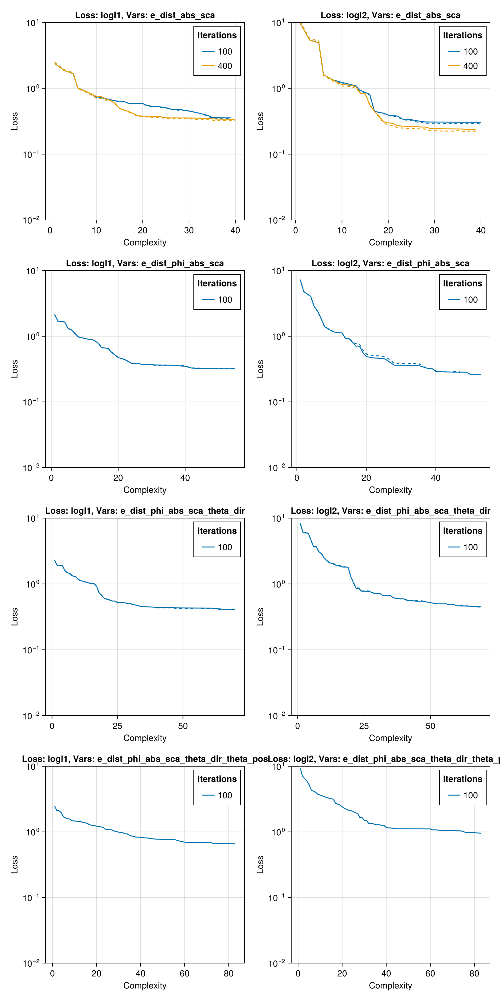

In [11]:
losses = ["logl1", "logl2"]

variable_configs = ["e_dist_abs_sca", "e_dist_phi_abs_sca", "e_dist_phi_abs_sca_theta_dir", "e_dist_phi_abs_sca_theta_dir_theta_pos"]

fig = Figure(size=(length(losses)*400, length(variable_configs)*400))

colors = Makie.wong_colors();
for (vix, variable_config) in enumerate(variable_configs)
    for (loss_ix, loss) in enumerate(losses)
        ax = Axis(fig[vix, loss_ix], yscale=log10, xlabel="Complexity", ylabel="Loss", title="Loss: $loss, Vars: $variable_config")
        for (nit, col) in zip([100, 400, 600, 800, 1000], colors)
            sel_run = "/home/wecapstor3/capn/capn100h/symbolic_regression/sr_$(variable_config)_True_$(loss)_$(nit)_True/"

            if ! isfile(joinpath(sel_run, "sr_state.jld2"))
                continue
            end
            try
                X, y, w, sr_summary = read_results(sel_run)
                lines!(ax, sr_summary.complexity, sr_summary.train_loss, color=col, label="$nit")
                lines!(ax, sr_summary.complexity, sr_summary.val_loss, color=col, linestyle=:dash)
                ylims!(ax, 1E-2, 1E1)
            catch e
                continue
            end
            
        end
        axislegend("Iterations")
    end
end
fig

## Dimensional Regularization

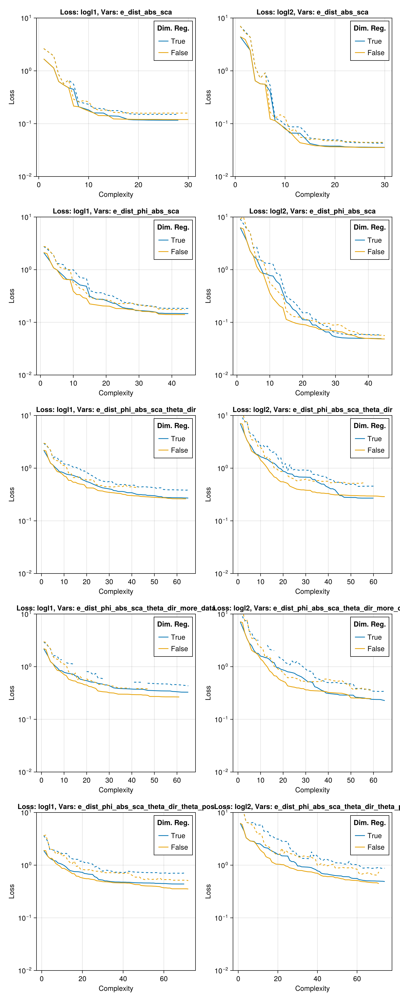

In [59]:
losses = ["logl1", "logl2"]

variable_configs = ["e_dist_abs_sca", "e_dist_phi_abs_sca", "e_dist_phi_abs_sca_theta_dir", "e_dist_phi_abs_sca_theta_dir_more_data", "e_dist_phi_abs_sca_theta_dir_theta_pos"]

fig = Figure(size=(length(losses)*400, length(variable_configs)*400))

colors = Makie.wong_colors();
for (vix, variable_config) in enumerate(variable_configs)
    for (loss_ix, loss) in enumerate(losses)
        ax = Axis(fig[vix, loss_ix], yscale=log10, xlabel="Complexity", ylabel="Loss", title="Loss: $loss, Vars: $variable_config")
        for (dimreg, col) in zip(["True", "False"], colors)
            sel_run = "/home/wecapstor3/capn/capn100h/symbolic_regression/sr_$(variable_config)_False_$(loss)_400_$(dimreg)/"

            if ! isfile(joinpath(sel_run, "sr_state.jld2"))
                continue
            end

            X, y, w, sr_summary = read_results(sel_run)
            lines!(ax, sr_summary.complexity, sr_summary.train_loss, color=col, label="$(dimreg)")
            lines!(ax, sr_summary.complexity, sr_summary.val_loss, color=col, linestyle=:dash)
            ylims!(ax, 1E-2, 1E1)
        end
        axislegend("Dim. Reg.")
    end
end
fig

## Weights

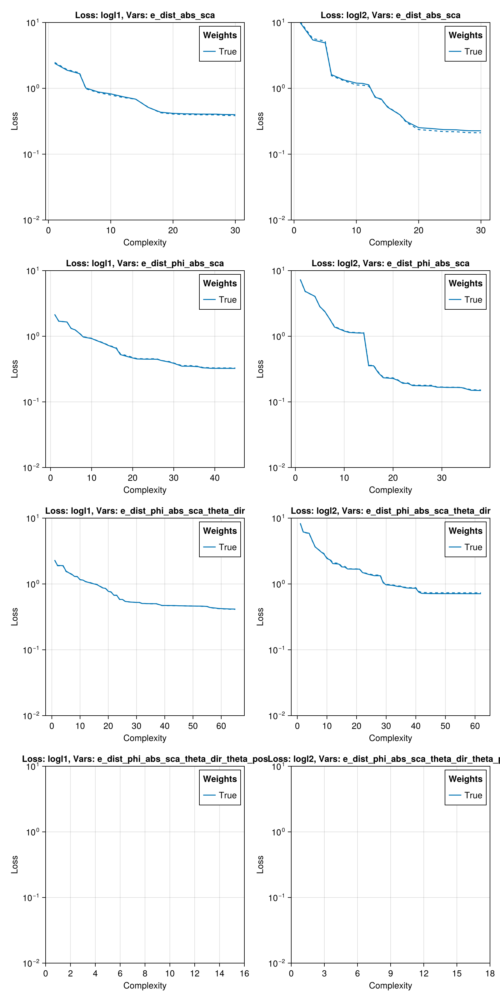

In [5]:
losses = ["logl1", "logl2"]
variable_configs = ["e_dist_abs_sca", "e_dist_phi_abs_sca", "e_dist_phi_abs_sca_theta_dir", "e_dist_phi_abs_sca_theta_dir_theta_pos"]

fig = Figure(size=(length(losses)*400, length(variable_configs)*400))

colors = Makie.wong_colors();
for (vix, variable_config) in enumerate(variable_configs)
    for (loss_ix, loss) in enumerate(losses)
        ax = Axis(fig[vix, loss_ix], yscale=log10, xlabel="Complexity", ylabel="Loss", title="Loss: $loss, Vars: $variable_config")
        for (usew, col) in zip(["True", "False"], colors)
            sel_run = "/home/wecapstor3/capn/capn100h/symbolic_regression/sr_$(variable_config)_$(usew)_$(loss)_100_True/"

            if ! isfile(joinpath(sel_run, "sr_state.jld2"))
                continue
            end

            X, y, w, sr_summary = read_results(sel_run)
            lines!(ax, sr_summary.complexity, sr_summary.train_loss, color=col, label="$(usew)")
            lines!(ax, sr_summary.complexity, sr_summary.val_loss, color=col, linestyle=:dash)
            ylims!(ax, 1E-2, 1E1)
        end
        axislegend("Weights")
    end
end
fig

## Dataset Size

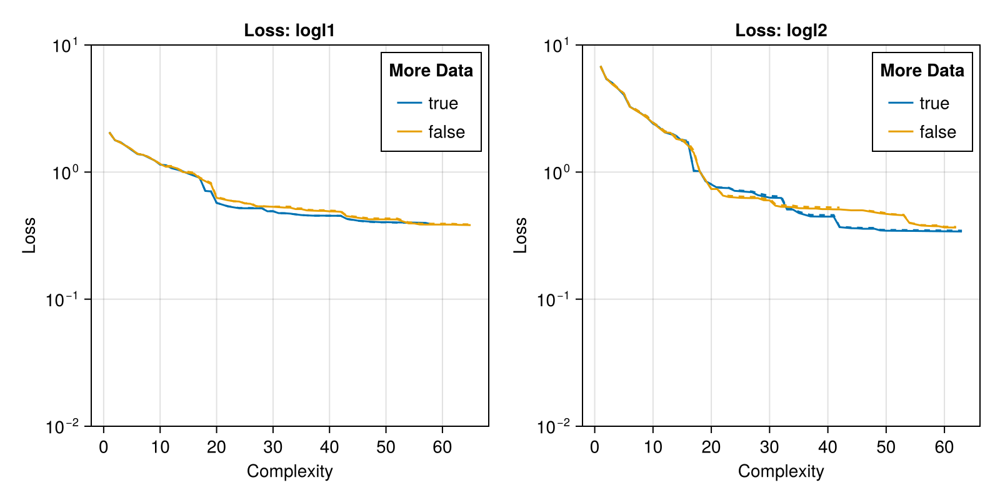

In [64]:
losses = ["logl1", "logl2"]


fig = Figure(size=(length(losses)*400, 400))

colors = Makie.wong_colors();
for (loss_ix, loss) in enumerate(losses)
    ax = Axis(fig[1, loss_ix], yscale=log10, xlabel="Complexity", ylabel="Loss", title="Loss: $loss")
    for (mored, col) in zip([true, false], colors)
        if mored
            mored_flag = "_more_data"
        else
            mored_flag = ""
        end
        sel_run = "/home/wecapstor3/capn/capn100h/symbolic_regression/sr_e_dist_phi_abs_sca_theta_dir$(mored_flag)_True_$(loss)_400_True/"

        if ! isfile(joinpath(sel_run, "sr_state.jld2"))
            continue
        end

        X, y, w, sr_summary = read_results(sel_run)
        lines!(ax, sr_summary.complexity, sr_summary.train_loss, color=col, label="$(mored)")
        lines!(ax, sr_summary.complexity, sr_summary.val_loss, color=col, linestyle=:dash)
        ylims!(ax, 1E-2, 1E1)
    end
    axislegend("More Data")
end

fig

In [51]:
sel_run = "/home/wecapstor3/capn/capn100h/symbolic_regression/sr_e_dist_phi_abs_sca_theta_dir_theta_pos_True_logl2_400_True/"
X, y, w, sr_summary = read_results(sel_run)

([91103.21249641891 1326.2323857688896 … 1960.0486259491365 1041.5981390764753; 20.008342742919922 2.151350498199463 … 2.3193397521972656 9.787911415100098; … ; 2.1521081694008313 0.9562542587514845 … 0.9788659235967088 1.4431047329939721; 0.7843683620411731 1.8064904299355589 … 1.1393654969492728 0.702208772225369], [915.5067815225083, 206.47339430221584, 0.20016656170659172, 0.3984135449294818, 6.804293433901705, 0.066305265907673, 0.04554492410470354, 0.12163052303503903, 4.0814244263499204e-5, 45.15562477832846  …  1.3622454388664915, 367.2888307048345, 0.5144778389932589, 9.064258140306272e-13, 8.254965736365935e-11, 5.002096166630551, 3251.5625869028336, 0.08935398948104407, 44.359151158750485, 2.8952256623695916], [24.05895174860004, 14.841875674929597, 1.512177528315252, 1.6672857390898408, 9.366324693893315, 1.13943984424711, 1.0583652950913687, 1.2857099497845015, 1.000058629589868, 7.110505870662996  …  3.192587837289616, 5.938754681686627, 3.924886085514954, 1.0, 1.0, 5.551

In [52]:
all(isfinite.(w))

true

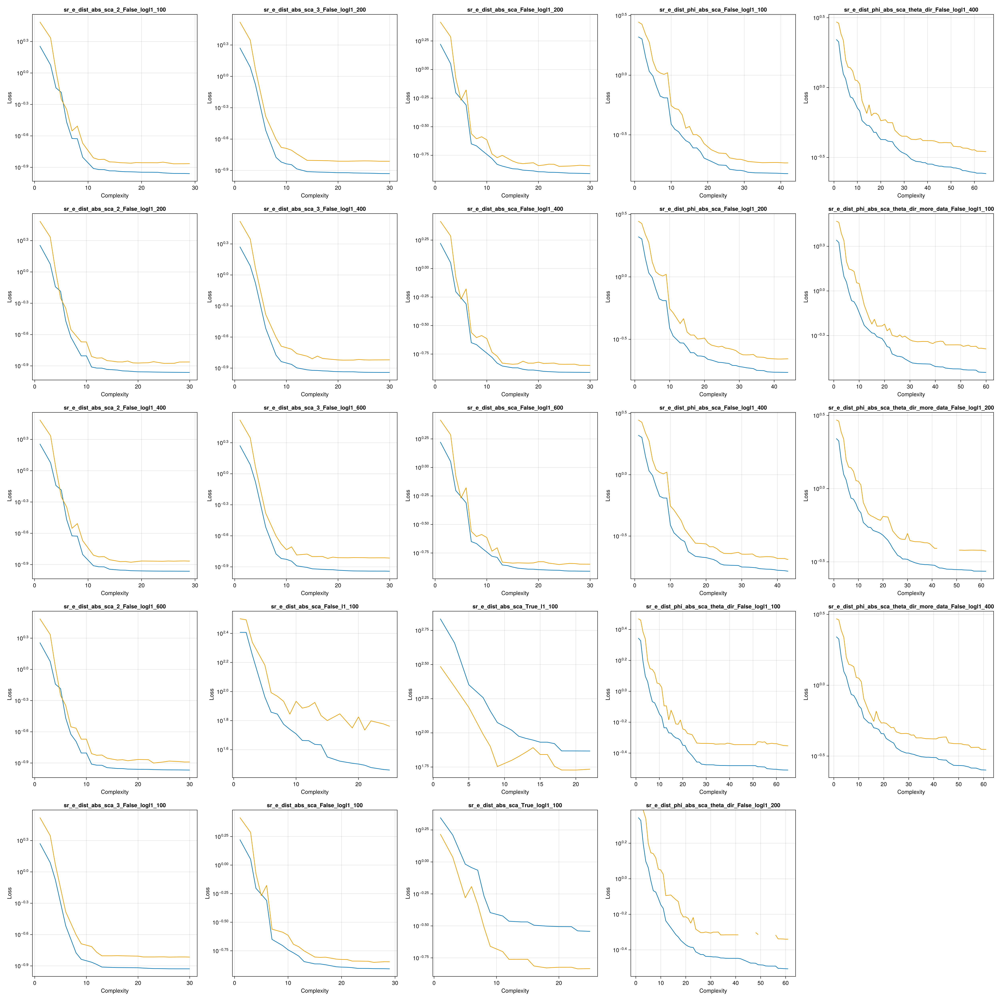

In [116]:
fig = Figure(size=(5*500, 5*500))
for (i, run) in enumerate(selected_runs)

    col, row = divrem(i-1, 5)

    row += 1
    col += 1

    X, y, w, sr_summary = read_results(run)

    ax = Axis(fig[row, col], yscale=log10, xlabel="Complexity", ylabel="Loss", title=basename(run))
    lines!(ax, sr_summary.complexity, sr_summary.train_loss)
    lines!(ax, sr_summary.complexity, sr_summary.val_loss)
end
fig


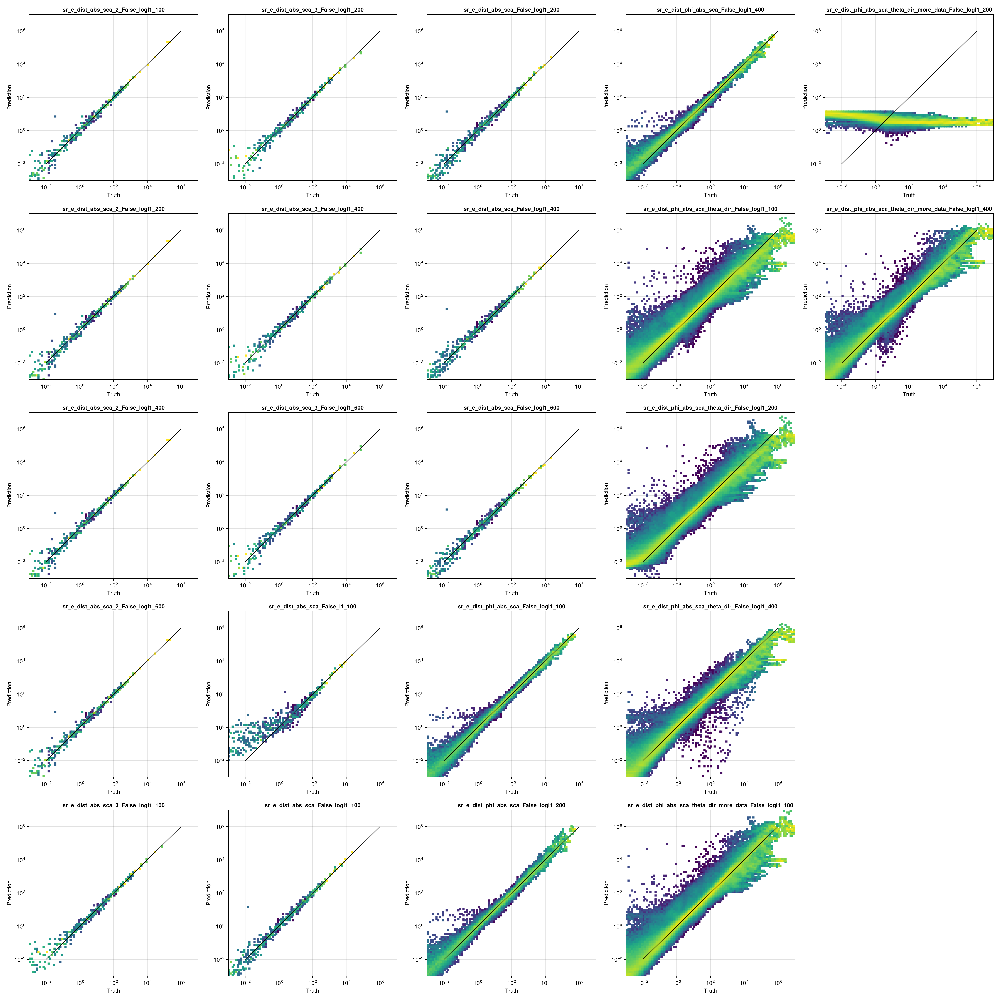

In [120]:
fig = Figure(size=(5*500, 5*500))
for (i, run) in enumerate(selected_runs)
    
    col, row = divrem(i-1, 5)

    row += 1
    col += 1

    X, y, w, sr_summary = read_results(run, false)
    best_val = argmin(sr_summary.val_loss)



    ax = Axis(fig[row, col], xlabel="Truth", ylabel="Prediction", title=basename(run), xscale=log10, yscale=log10)
    plot_pred_target(X, y, sr_summary.equation[best_val], ax)
end
fig

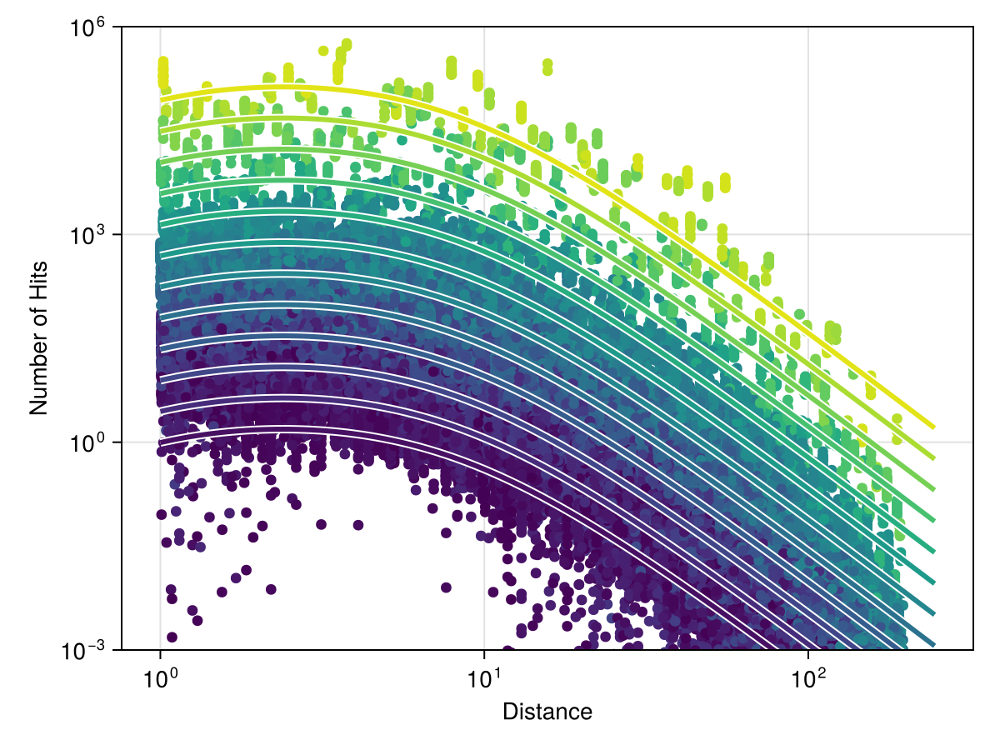

In [8]:
X, y, w, sr_summary = read_results(finished_runs[end], false) 
fig = Figure()
ax = Axis(fig[1, 1], yscale=log10, xscale=log10, xlabel="Distance", ylabel="Number of Hits")
sel = (X[5, :] .< 0.1) .&& (X[5, :] .> -0.1)
sel = (X[6, :] .< 1.5) .&& (X[6, :] .> 1.3)
plot_distance_energy(X[:, sel], y[sel], sr_summary.equation[25], [(3, 1.0), (4, 1.0), (5, 0.0), (6, 1.4)], ax)
fig


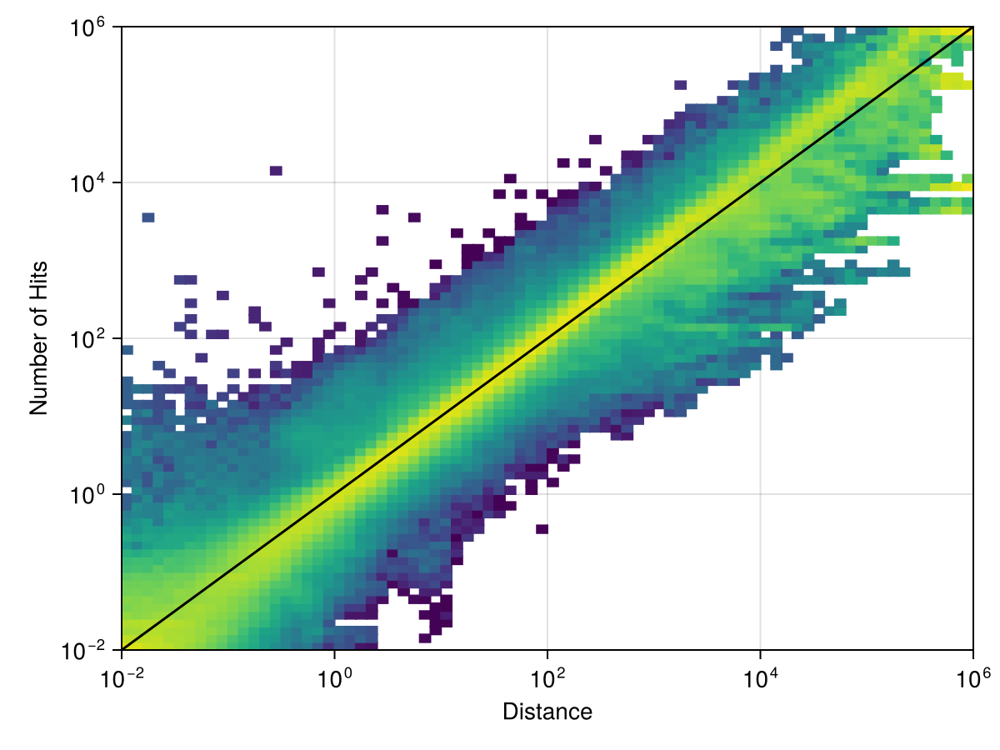

In [67]:
best_val = argmin(sr_summary.val_loss)
fig = Figure()
ax = Axis(fig[1, 1], yscale=log10, xscale=log10, xlabel="Distance", ylabel="Number of Hits")
plot_pred_target(X, y, sr_summary.equation[30], ax)
fig

In [98]:
display(collect(zip(eachindex(finished_runs), basename.(finished_runs))))

26-element Vector{Tuple{Int64, String}}:
 (1, "sr_e_dist_abs_sca_2_False_logl1_100")
 (2, "sr_e_dist_abs_sca_2_False_logl1_200")
 (3, "sr_e_dist_abs_sca_2_False_logl2_100")
 (4, "sr_e_dist_abs_sca_2_False_logl2_200")
 (5, "sr_e_dist_abs_sca_3_False_logl1_100")
 (6, "sr_e_dist_abs_sca_3_False_logl1_200")
 (7, "sr_e_dist_abs_sca_3_False_logl2_100")
 (8, "sr_e_dist_abs_sca_3_False_logl2_200")
 (9, "sr_e_dist_abs_sca_False_l1_100")
 (10, "sr_e_dist_abs_sca_False_l2_100")
 ⋮
 (18, "sr_e_dist_abs_sca_True_logl1_100")
 (19, "sr_e_dist_abs_sca_True_logl2_100")
 (20, "sr_e_dist_abs_sca_True_poisson_100")
 (21, "sr_e_dist_phi_abs_sca_False_logl1_100")
 (22, "sr_e_dist_phi_abs_sca_False_logl2_100")
 (23, "sr_e_dist_phi_abs_sca_theta_dir_False_logl1_100")
 (24, "sr_e_dist_phi_abs_sca_theta_dir_False_logl2_100")
 (25, "sr_e_dist_phi_abs_sca_theta_dir_more_data_False_logl1_100")
 (26, "sr_e_dist_phi_abs_sca_theta_dir_more_data_False_logl2_100")

In [30]:
run_1 = joinpath(run_dir, "sr_e_dist_abs_sca_True_logl2_600_True")
X, y, w, sr_summary = read_results(run_1, false) 
run_2 = joinpath(run_dir, "sr_e_dist_abs_sca_2_True_logl2_600_True")
X, y, w, sr_summary2 = read_results(run_2, false) 
run_3 = joinpath(run_dir, "sr_e_dist_abs_sca_3_True_logl2_600_True")
X, y, w, sr_summary3 = read_results(run_3, false) 


sr_summary_combined = outerjoin(sr_summary, sr_summary2, on=:complexity, renamecols = "_1" => "_2")
sr_summary_combined = outerjoin(sr_summary_combined, sr_summary3, on=:complexity, renamecols = "" => "_3")


sort!(sr_summary_combined, :complexity)
tbl_str = pretty_table(String, sr_summary_combined[:, [:complexity, :eq_latex_1, :val_loss_1, :eq_latex_2, :val_loss_2, :eq_latex_3, :val_loss_3,]], backend=Val(:markdown))

tbl_str = replace(tbl_str, "energy" => "\\mathrm{E}", "distance" => "\\mathrm{d}", "abs\\_{scale}" => "\\epsilon_a", "sca\\_{scale}" => "\\epsilon_s")

display("text/markdown", tbl_str)

#display("text/markdown", )

#display("text/markdown", sr_summary[:, [:complexity, :eq_latex]])

ArgumentError: ArgumentError: No file exists at given path: /home/wecapstor3/capn/capn100h/symbolic_regression/sr_e_dist_abs_sca_True_logl2_600_True/sr_state.jld2

In [92]:
tbl_str

"| **complexity**<br>`Int64` | **eq\\_latex**<br>`LaTeXStrings.LaTeXString`                                                                                                                                                                                                     " ⋯ 6944 bytes ⋯ "left( \\mathrm{E} + \\frac{0.466365318324189}{\\log\\left( \\mathrm{d} \\right)} \\right) \\cdot e^{-2.818958048401017 \\cdot \\mathrm{d}^{0.35704204136058576}} \\right)^{0.5922033753433028 + e^{-1 \\cdot 1.5994845305175003^{abs\\_{scale} \\cdot 0.8008484832119209^{\\mathrm{d}}}}}\$ |\n"

In [53]:
l_str = L"\begin{table}{lcl}
\toprule
Equation Index & Complexity & Equation \\
\bottomrule
\end{tabular}"

L"$\begin{table}{lcl}
\toprule
Equation Index & Complexity & Equation \\
\bottomrule
\end{tabular}$"

In [23]:
latexify(string(sr_summary.eq_sym[end]))

(((energy / ((exp(cos(delta_phi)) / theta_dir) ^ theta_dir)) / (exp(-1 * ((1.8203478434634868 * (cos(distance) + (-1 * (abs_scale + (-1 * (((-26.563773869584736 / (-0.08498856665429434 * energy)) / 1.1902325967483751) / 0.08479718640976025)) + (theta_dir ^ 2))))) / distance)) + (-1 * (theta_dir ^ 4)) + ((2.4525823619324774 + distance + ((-0.22257556731155273 + (-1 * theta_dir) + (distance / 4.000693787836328)) ^ 2)) ^ 2))) ^ 0.8933237017560693) * abs_scale

"\$\\left( \\frac{\\frac{energy}{\\left( \\frac{e^{\\cos\\left( delta_{phi} \\right)}}{theta_{dir}} \\right)^{theta_{dir}}}}{e^{ - \\frac{\\left( \\cos\\left( distance \\right) - \\left( theta_{dir}^{2} + abs_{scale} - \\frac{\\frac{\\frac{-26.563773869584736}{energy \\cdot -0.08498856665429" ⋯ 79 bytes ⋯ "434634868}{distance}} - \\left( theta_{dir}^{2} \\right)^{2} + \\left( distance + \\left( \\frac{distance}{4.000693787836328} -0.22257556731155273 - theta_{dir} \\right)^{2} + 0.12499405928660105 + 2.3275883026458764 \\right)^{2}} \\right)^{0.8933237017560693} \\cdot abs_{scale}\$"

In [26]:
latexify(string(simplify(sr_summary.eq_sym[15])))

L"$\frac{\frac{energy}{e^{-1 \cdot \left( theta_{dir} -1 \cdot theta_{dir} \cdot \cos\left( delta_{phi} \right) \right)}}}{\left( -13.016852069668555 -1 \cdot \left( \frac{distance}{-3.0112372301056824} \right)^{2} \right)^{2}}$"

In [9]:
fig = Figure()
ax = Axis(fig[1])

MethodError: MethodError: no method matching getindex(::Figure, ::Int64)

Closest candidates are:
  getindex(::Figure, ::Any, !Matched::Any)
   @ Makie ~/.julia/packages/Makie/We6MY/src/figures.jl:130
  getindex(::Figure, ::Any, !Matched::Any, !Matched::Any)
   @ Makie ~/.julia/packages/Makie/We6MY/src/figures.jl:130
